# Task 2
5390<br>
Elaina Rohlfing

## Load the data
* Upload & unzip the dataset
* Load training and validation images

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! rm -rf morel-dataset
! unzip -qq "/content/drive/MyDrive/Colab Notebooks/morel-dataset.zip"
! mv morel-dataset* morel-dataset

In [4]:
! ls -l morel-dataset/validation

total 8
drwxr-xr-x 2 root root 4096 May  3 04:57 morel
drwxr-xr-x 2 root root 4096 May  3 04:58 none


## Prepare the images (training and validation)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np

def get_images(image_size=(256, 256), size_of_batch=32):
    # Rescale all images
    img_generator = ImageDataGenerator(rescale=1./255)

    tr = img_generator.flow_from_directory( "./morel-dataset/train", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    val = img_generator.flow_from_directory( "./morel-dataset/validation", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    tst = img_generator.flow_from_directory( "./morel-dataset/test", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    return tr, val, tst


# Review details of dataset
def print_data_characteristics(data):
    print(f'{data.class_indices=}')
    print(f'{data.num_classes=}')
    print(f'{data.batch_size=}')
    print(f'{data.samples=}')
    print(f'{data.image_shape=}')
    imgs, lbls = data[0]
    print(f'{lbls.shape=}')
    print(f'{lbls=}')

    # check baseline accurracy (for majority class in binary classification)
    num_class0 = data.classes[data.classes == 0].size
    num_class1 = data.classes[data.classes == 1].size
    class1_relative_size = (100 * (num_class1/(num_class0 + num_class1)))
    class0_relative_size = (100 - class1_relative_size)
    if class1_relative_size > class0_relative_size:
        print(f'\nMajority class is class[1]\nBaseline accuracy for this dataset is: {class1_relative_size:.2f}%')
    else:
        print(f'\nMajority class is class[0]\nBaseline accuracy for this dataset is: {class0_relative_size:.2f}%')


# Displays one image and its label
def display_image(dataset, img_index=0, batch_index=0):
    images, labels = dataset[batch_index]
    class_index = int(labels[img_index])
    classes = list(dataset.class_indices.keys())

    plt.imshow(images[img_index])
    plt.title(f"Ground truth: {str(labels[img_index])}\n{classes[class_index]}") # add name of label train_ds.class_indices
    plt.axis("off")

# Displays multiple random images in a grid
def review_generator_results(image_gen, batch_number=0, num_images=6, num_rows=2):
    indices = np.random.choice(image_gen.batch_size, size=num_images, replace=False)
    plt.figure(figsize=(12, 8))
    for i, img_idx in enumerate(indices):
        plt.subplot(num_rows, (len(indices) + 1) // num_rows, i + 1)
        display_image(image_gen, img_idx, batch_number)
    plt.tight_layout()
    plt.show()
    print_data_characteristics(image_gen)

In [6]:
train_set, val_set, test_set = get_images()

Found 552 images belonging to 2 classes.
Found 160 images belonging to 2 classes.
Found 80 images belonging to 2 classes.


**Display images with their labels**

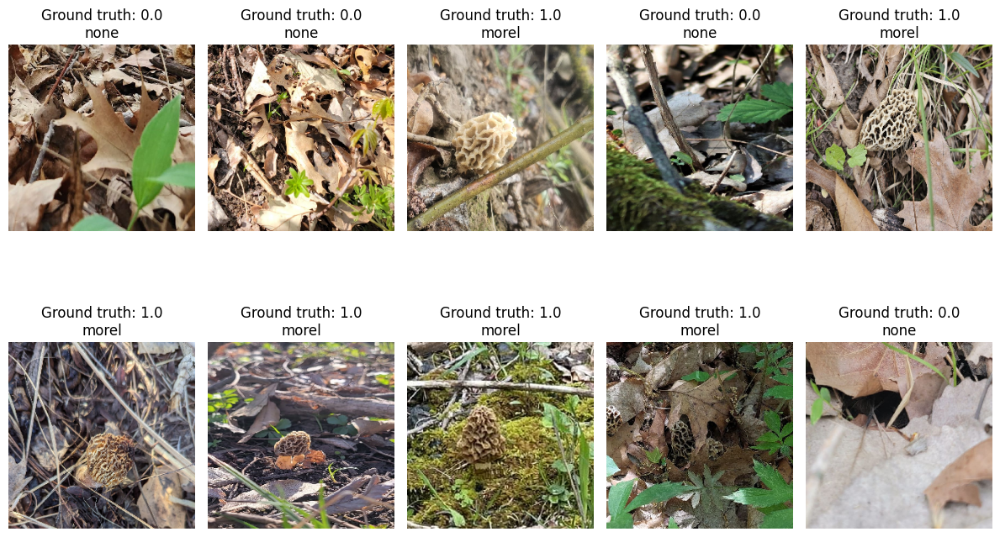

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=552
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [7]:
review_generator_results(train_set, num_images=10, num_rows=2)

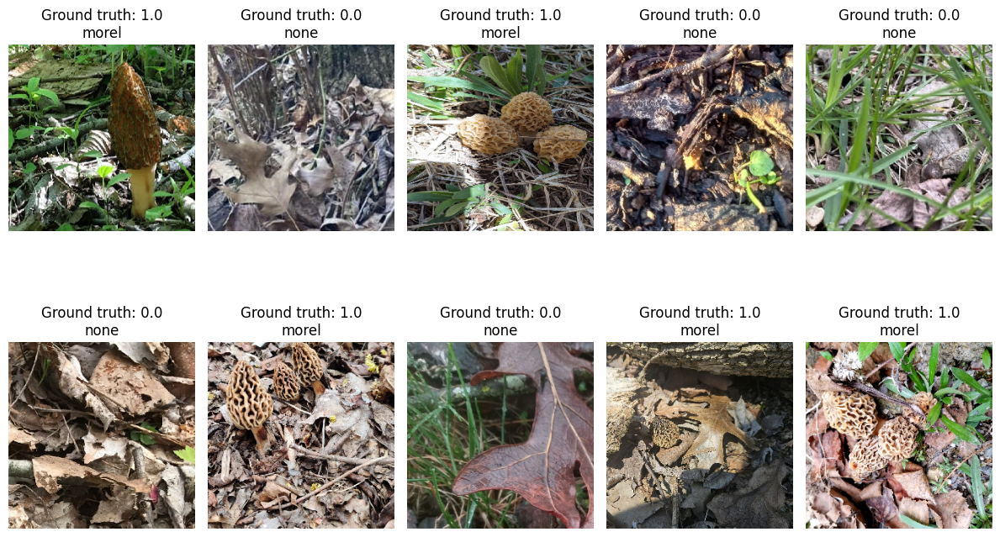

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=160
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [8]:
review_generator_results(val_set, num_images=10, num_rows=2)

# Functions

## Plot learning curves

In [9]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_learning_curves(hist, title, validate=False):
    fig, axs = plt.subplots(2, 1, figsize=(6, 7))
    epochs = range(1, len(hist.history['loss']) + 1)

    if validate:
        axs[0].plot(epochs, hist.history['val_accuracy'], label='Validation Accuracy', color="forestgreen") #marker='o', markersize=3, linestyle='', color="forestgreen"
    axs[0].plot(epochs, hist.history['accuracy'], label='Training Accuracy', color="limegreen")
    axs[0].set_title("Accuracy for " + title)
    axs[0].set_ylabel("Accuracy")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylim([0, 1])
    axs[0].legend()

    if validate:
        axs[1].plot(epochs, hist.history['val_loss'], label='Validation Loss', color="forestgreen") #marker='o', markersize=3, linestyle='', color="forestgreen"
    axs[1].plot(epochs, hist.history['loss'], label='Training Loss', color="limegreen")
    axs[1].set_title("Loss for " + title)
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("Loss")
    axs[1].set_ylim([0, 1])
    axs[1].legend()

    plt.tight_layout()
    plt.show()


def plot_stacked_learning_curves(histories, history_labels, title):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(7, 4))

    colors = list([color for color, rgb in mcolors.CSS4_COLORS.items() if mcolors.rgb_to_hsv(mcolors.to_rgba(rgb)[:3])[2] < 0.9])

    # Plot training and validation accuracy
    for i, h in enumerate(histories):
        axs[0].plot(h.history['accuracy'], label=f'Train Acc {history_labels[i]}', color=colors[i])
        axs[0].plot(h.history['val_accuracy'], label=f'Val Acc {history_labels[i]}', color=colors[i], marker='o', markersize=3, linestyle='')
    axs[0].set_title(f'Accuracy - Model {i+1}')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_ylim([0, 1])
    axs[0].legend()

    # Plot training and validation loss
    for i, h in enumerate(histories):
        axs[1].plot(h.history['loss'], label=f'Train Loss {history_labels[i]}', color=colors[i])
        axs[1].plot(h.history['val_loss'], label=f'Val Loss {history_labels[i]}', color=colors[i], marker='o', markersize=3, linestyle='')
    axs[1].set_title(f'Loss - Model {i+1}')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].set_ylim([0, 1])
    axs[1].legend()

    plt.tight_layout()
    plt.show()

## View Predictions

In [10]:
# modified code from chatgpt
def plot_misclassified_images(model, data_generator, num_images_per_class=4):
    images, true_labels = data_generator.next()
    predictions = model.predict(images)
    predicted_labels = np.round(predictions).flatten().astype(int)  # Round predictions for binary classification

    misclassified_indices = np.where(predicted_labels != true_labels)[0][:10]
    misclassified_morel = np.where((predicted_labels == 1) & (predicted_labels != true_labels))[0][:]
    misclassified_none = np.where((predicted_labels == 0) & (predicted_labels != true_labels))[0][:]

    plt.figure(figsize=(12, 8))
    for i, idx in enumerate(misclassified_none):
        image = images[idx]
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, i + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if i == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(12, 8))
    for j, idx in enumerate(misclassified_morel):
        image = images[idx]
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, j + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if j == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

In [11]:
# modified code from chatgpt
def plot_successful_predictions(model, data_generator, num_images_per_class=4):
    images, true_labels = data_generator.next()
    predictions = model.predict(images)
    predicted_labels = np.round(predictions).flatten().astype(int)  # Round predictions for binary classification

    classified_indices = np.where(predicted_labels == true_labels)[0][:]
    classified_morel = np.where((predicted_labels == 1) & (predicted_labels == true_labels))[0][:]
    classified_none = np.where((predicted_labels == 0) & (predicted_labels == true_labels))[0][:]

    plt.figure(figsize=(12, 8))
    for i, idx in enumerate(classified_none):
        image = images[idx]  # Get the image from the generator
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, i + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if i == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 8))
    for j, idx in enumerate(classified_morel):
        image = images[idx]  # Get the image from the generator
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, j + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if j == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

## Check activations

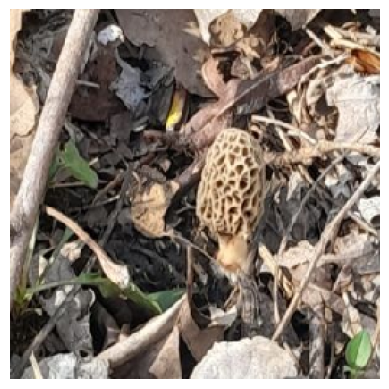

(1, 256, 256, 3)

In [ ]:
import matplotlib.pyplot as plt
from tensorflow import keras
import numpy as np


def get_img_array(img_path, target_size):
    image = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(image)
    array = np.expand_dims(array, axis=0)
    return array

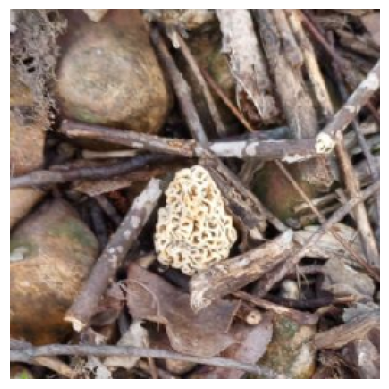

1/1 [==============================] - 0s 19ms/step


array([[0.]], dtype=float32)

In [ ]:
img_tensor = get_img_array("/content/morel-dataset/train/morel/12930-16696-26633.jpg", target_size=(256, 256))

plt.imshow(img_tensor[0].astype('uint8'))
plt.axis('off')
plt.show()
img_tensor.shape

model.predict(img_tensor)


In [ ]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 27ms/step


(1, 256, 256, 6)


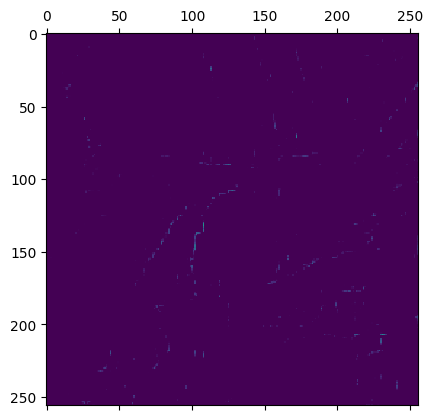

In [ ]:
import matplotlib.pyplot as plt

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

n_features=6 n_cols=3 size=256
n_features=6 n_cols=3 size=43
n_features=4 n_cols=2 size=43
n_features=4 n_cols=2 size=8
n_features=3 n_cols=1 size=8
n_features=3 n_cols=1 size=2
n_features=2 n_cols=1 size=2


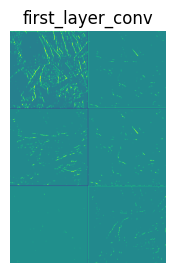

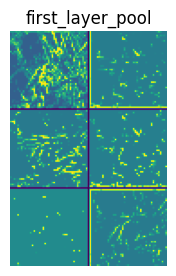

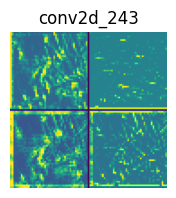

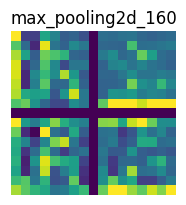

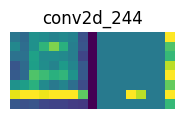

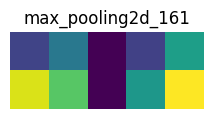

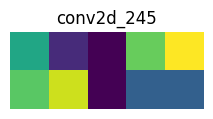

In [ ]:
images_per_row = 2
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = max(1, n_features // images_per_row)
    print(f'{n_features=} {n_cols=} {size=}')
    display_grid = np.zeros(((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype("uint8")
                display_grid[
                    col * (size + 1): (col + 1) * size + col,
                    row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Visualize filters

# Best models

### Some model builds

In [15]:
from tensorflow import keras
from tensorflow.keras import datasets, layers, models

# try with validation set
# 1049 params: 100 epochs, batch 128, this model achieves loss/acc 0.3309/0.8605 - vloss/vacc: 0.5548/0.700
def model_overfit_choice(input):
    model_name="best_overfit_model"
    num_filters = [6, 6, 4]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# best batch size
# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_for_batch_64(input):
    model_name="model_best_for_batch_64"
    num_filters = [6, 8, 12]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_image_size(input):
    model_name="model_best_image_size"
    num_filters = [6, 6, 4]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model


# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_filters(input):
    model_name="model_best_filters"
    num_filters = [6, 6, 4]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_layers(input):
    model_name="model_best_layers"
    num_filters = [6, 6, 4]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_kernal_size(input):
    model_name="model_kernal_size"
    num_filters = [6, 6, 4]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_fit(input):
    model_name="model_best_fit"
    num_filters = [6, 8, 12]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

def textbook_model(input):
    model_name="textbook_model"
    pool=2
    kernel=3
    inputs = keras.Input(shape=input.image_shape)
    x = layers.Conv2D(filters=32, kernel_size=kernel, activation="relu")(inputs)
    x = layers.MaxPooling2D(pool_size=pool)(x)
    x = layers.Conv2D(filters=64, kernel_size=kernel, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=pool)(x)
    x = layers.Conv2D(filters=128, kernel_size=kernel, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=pool)(x)
    x = layers.Conv2D(filters=256, kernel_size=kernel, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=pool)(x)
    x = layers.Conv2D(filters=256, kernel_size=kernel, activation="relu")(x)
    x = layers.Flatten()(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)
    model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)
    return model

# Training

In [12]:
from tensorflow.keras import callbacks
# general callback for all models
cb_stopping = callbacks.EarlyStopping(monitor="val_loss", patience=30)

## Run overfit once with the validation set
* Epoch 100/100 4s 222ms/step - loss: 0.3309 - accuracy: 0.8605 - val_loss: 0.5548 - val_accuracy: 0.700

### Train

In [ ]:
stop

In [21]:
# Model selection for this run
model = model_overfit_choice(train_set)
model.summary()

# training variables
batch = 128
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
#model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
#history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "best_overfit_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 6)         330       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 4, 4, 6)           0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 4)           220       
                                                                 
 flatten_1 (Flatten)         (None, 64)         

### Review

In [110]:
from tensorflow.keras.models import load_model
best_overfit = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-best_overfit_model-batch128.hg5")
best_overfit.evaluate(val_set)

5/5 [==============================] - 1s 188ms/step - loss: 0.5161 - accuracy: 0.7312


[0.5160702466964722, 0.731249988079071]

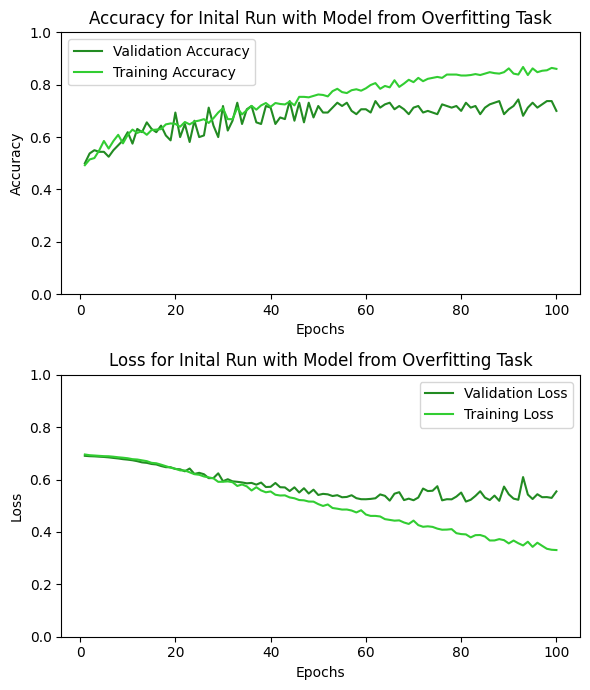

In [28]:
plot_learning_curves(history, title="Inital Run with Model from Overfitting Task", validate=True)

## Adjustments to the overfitting model
* Starting from overfit 6,6,4 batch 128:
 * Epoch 100/100 4s 222ms/step - loss: 0.3309 - accuracy: 0.8605 - val_loss: 0.5548 - val_accuracy: 0.700
* Filters increased: 6,8,12|Batch 128: Epoch 72/100 loss: 0.2475 - accuracy: 0.9076 - val_loss: 0.5627 - val_accuracy: 0.7125
* **Filters 6,8,12|Batch reduced to 64: Epoch 69/100 loss: 0.3308 - accuracy: 0.8569 - val_loss: 0.5122 - val_accuracy: 0.7500**
* Filters 6,8,12|Batch reduced to 32: Epoch 66/100 loss: 0.3441 - accuracy: 0.8696 - val_loss: 0.5966 - val_accuracy: 0.7188
* Filters increased: 8,10,16|Batch 32: Epoch 50/100 loss: 0.3132 - accuracy: 0.8841 - val_loss: 0.7668 - val_accuracy: 0.6000
* Filters 8,10,16|Batch increased to 128: Epoch 82/100 loss: 0.2885 - accuracy: 0.8967 - val_loss: 0.6212 - val_accuracy: 0.7000

### Models for tuning steps

In [60]:
# 2261 params: In about 72 epochs, with batch size 128, this model's loss/acc 0.2475/0.9076 - vloss/vacc 0.5627/0.7125
# 2261 params: restarting for 69 epochs, with batch 64, this model's loss/acc 0.3308/0.8569 - vloss/vacc 0.5122/0.7500
def model_increasing_filters(input):
    model_name="model_increasing_filters"
    num_filters = [6, 8, 12]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# mostly dissapointing results
# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_more_filters(input):
    model_name="model_more_filters"
    num_filters = [6, 12, 18]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

### Train

#### model_increasing_filters

In [ ]:
stop

In [38]:
# Model selection for this run
#model = model_increasing_filters(train_set)
#model.summary()

Model: "model_increasing_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_5 (Flatten)         (None, 192)  

**Increasing the number of filters in last layer to improve learning power**
* Epoch 72/100 loss: 0.2475 - accuracy: 0.9076 - val_loss: 0.5627 - val_accuracy: 0.7125

In [42]:
# Model selection for this run
model = model_increasing_filters(train_set)
model.summary()

# training variables
batch = 128
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
#model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
#history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_increasing_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_8 (Flatten)         (None, 192)  

**Reducing the batch size to slow overfitting**
* Epoch 69/100 loss: 0.3308 - accuracy: 0.8569 - val_loss: 0.5122 - val_accuracy: 0.7500

In [48]:
# Model selection for this run
model = model_increasing_filters(train_set)
model.summary()

# training variables
batch = 64
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_increasing_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_9 (Flatten)         (None, 192)  

**Reducing the batch size further (32)**
* Epoch 66/100 loss: 0.3441 - accuracy: 0.8696 - val_loss: 0.5966 - val_accuracy: 0.7188

In [52]:
# Model selection for this run
model = model_increasing_filters(train_set)
model.summary()

# training variables
batch = 32
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_increasing_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_31 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 4, 4, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_32 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_10 (Flatten)        (None, 192)  

#### model_more_filters

In [ ]:
stop

In [61]:
# Model selection for this run
#model = model_more_filters(train_set)
#model.summary()

Model: "model_more_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_40 (Conv2D)          (None, 32, 32, 12)        660       
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 4, 4, 12)          0         
 ng2D)                                                           
                                                                 
 conv2d_41 (Conv2D)          (None, 4, 4, 18)          1962      
                                                                 
 flatten_13 (Flatten)        (None, 288)        

**Increasing the number of filters further, with batch size reduced to 32**
* Epoch 50/100 loss: 0.3132 - accuracy: 0.8841 - val_loss: 0.7668 - val_accuracy: 0.6000
* Disappointing results

In [62]:
# Model selection for this run
model = model_more_filters(train_set)
model.summary()

# training variables
batch = 32
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_more_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_43 (Conv2D)          (None, 32, 32, 12)        660       
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 4, 4, 12)          0         
 ng2D)                                                           
                                                                 
 conv2d_44 (Conv2D)          (None, 4, 4, 18)          1962      
                                                                 
 flatten_14 (Flatten)        (None, 288)        

**Increasing the number of filters further, rerun with batch size increased to 128**
* Epoch 82/100 loss: 0.2885 - accuracy: 0.8967 - val_loss: 0.6212 - val_accuracy: 0.7000

In [66]:
# Model selection for this run
model = model_more_filters(train_set)
model.summary()

# training variables
batch = 128
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_more_filters"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_49 (Conv2D)          (None, 32, 32, 12)        660       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 4, 4, 12)          0         
 ng2D)                                                           
                                                                 
 conv2d_50 (Conv2D)          (None, 4, 4, 18)          1962      
                                                                 
 flatten_16 (Flatten)        (None, 288)        

### Review

In [53]:
from tensorflow.keras.models import load_model

In [ ]:
stop

5/5 [==============================] - 1s 180ms/step - loss: 0.5018 - accuracy: 0.7625


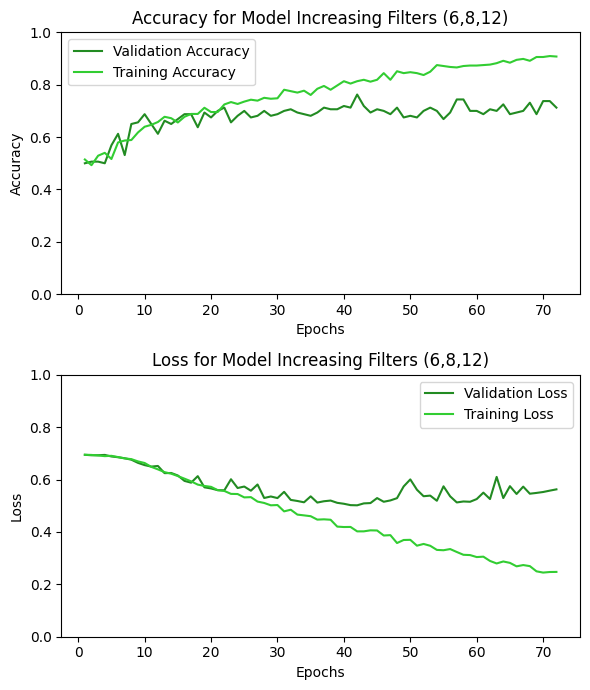

In [47]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_increasing_filters-batch128.hg5")
model.evaluate(val_set)
plot_learning_curves(history, title="Model Increasing Filters (6,8,12)", validate=True)

5/5 [==============================] - 1s 190ms/step - loss: 0.4890 - accuracy: 0.7563


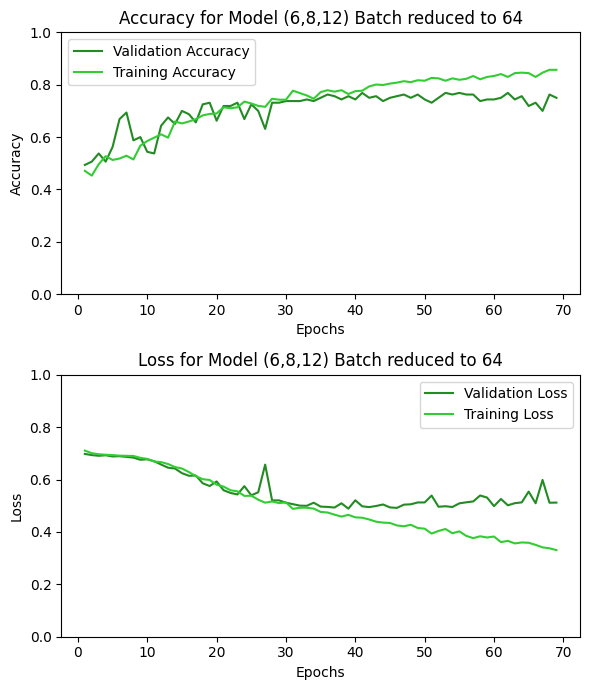

In [50]:
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_increasing_filters-batch64.hg5")
model.evaluate(val_set)
plot_learning_curves(history, title="Model (6,8,12) Batch reduced to 64", validate=True)

5/5 [==============================] - 1s 174ms/step - loss: 0.5270 - accuracy: 0.7250


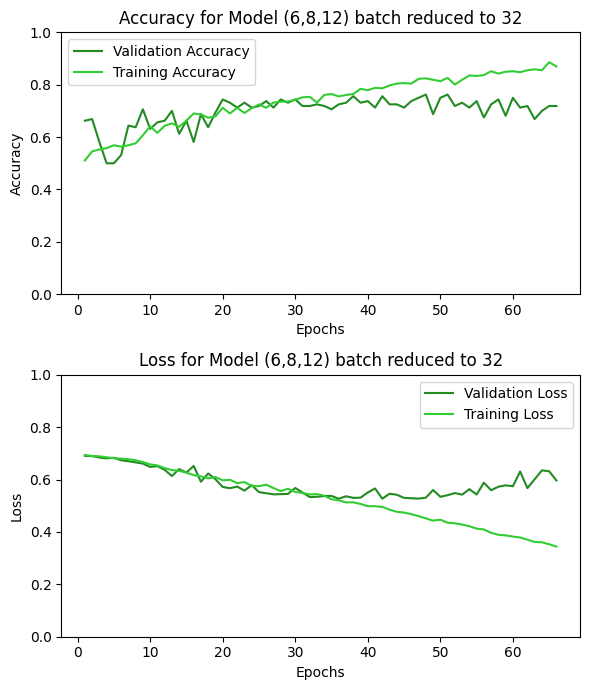

In [56]:
batch_32 = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_increasing_filters-batch32.hg5")
batch_32.evaluate(val_set)
plot_learning_curves(history, title="Model (6,8,12) batch reduced to 32", validate=True)

5/5 [==============================] - 1s 171ms/step - loss: 0.5979 - accuracy: 0.6812


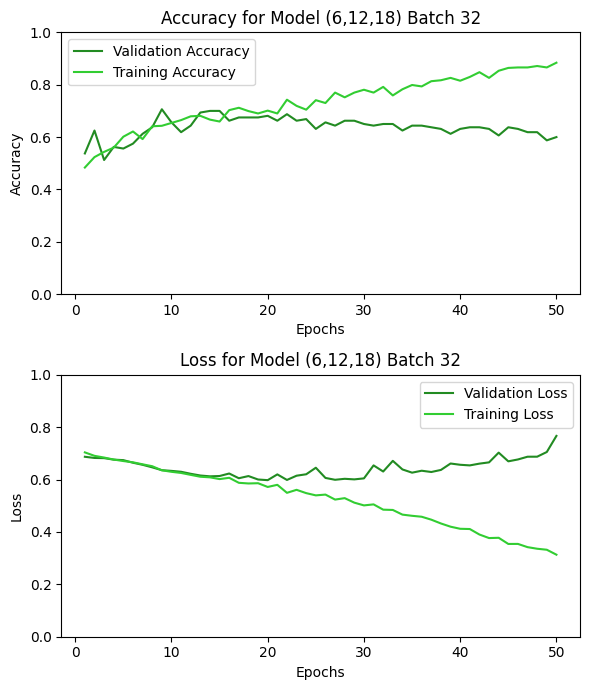

In [64]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_more_filters-batch32.hg5")
model.evaluate(val_set)
plot_learning_curves(history, title="Model (6,12,18) Batch 32", validate=True)

5/5 [==============================] - 1s 193ms/step - loss: 0.5316 - accuracy: 0.7250


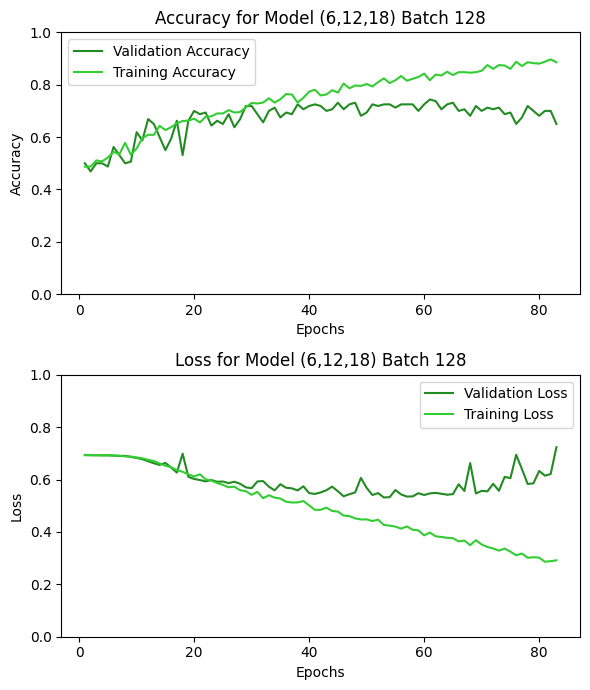

In [71]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_more_filters-batch128.hg5")
model.evaluate(val_set)
plot_learning_curves(history, title="Model (6,12,18) Batch 128", validate=True)

## Adjustments to new model
* starting from Filters 6,8,12 Batch 64:
 * Epoch 69/100 loss: 0.3308 - accuracy: 0.8569 - val_loss: 0.5122 - val_accuracy: 0.7500
* Deeper model 6,8,12,16|batch 98: Epoch 60/100 loss: 0.4120 - accuracy: 0.8460 - val_loss: 0.6764 - val_accuracy: 0.6438

### Models used

In [107]:
# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_best_for_batch_64(input):
    model_name="model_best_for_batch_64"
    num_filters = [6, 8, 12]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

## increasing and decreasing kernals hurt
## increasing and decreasing pool hurt

# ?? params: In about ?? epochs, with batch size ??, this model's accuracy is ??%
def model_deeper(input):
    model_name="model_deeper"
    num_filters = [6, 8, 12, 16]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (6,6)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[3], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(6, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

### Train

#### model_deeper

In [ ]:
stop

In [108]:
# Model selection for this run
model = model_deeper(train_set)
model.summary()

Model: "model_deeper"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_124 (Conv2D)         (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 43, 43, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_125 (Conv2D)         (None, 43, 43, 8)         440       
                                                                 
 max_pooling2d_52 (MaxPooli  (None, 8, 8, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_126 (Conv2D)         (None, 8, 8, 12)          876       
                                                                 
 max_pooling2d_53 (MaxPooli  (None, 2, 2, 12)         

**Creating a deeper model improve learning power**
* Epoch 60/100 loss: 0.4120 - accuracy: 0.8460 - val_loss: 0.6764 - val_accuracy: 0.6438

In [109]:
# Model selection for this run
model = model_deeper(train_set)
model.summary()

# training variables
batch = 98
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_deeper"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_128 (Conv2D)         (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 43, 43, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_129 (Conv2D)         (None, 43, 43, 8)         440       
                                                                 
 max_pooling2d_54 (MaxPooli  (None, 8, 8, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_130 (Conv2D)         (None, 8, 8, 12)          876       
                                                                 
 max_pooling2d_55 (MaxPooli  (None, 2, 2, 12)         

### Review

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
stop

5/5 [==============================] - 1s 188ms/step - loss: 0.6013 - accuracy: 0.6750


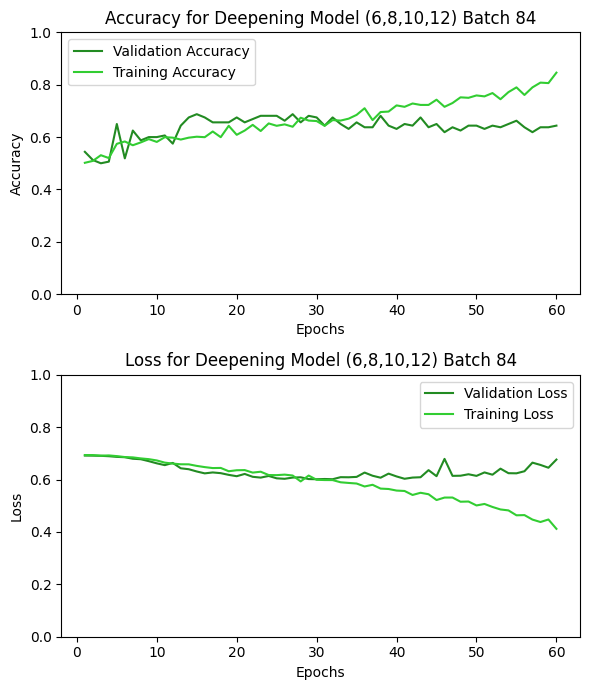

In [112]:
model = load_model(f"/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-model_deeper-batch98.hg5")
model.evaluate(val_set)
plot_learning_curves(history, title="Deepening Model (6,8,10,12) Batch 84", validate=True)

## Last try

In [48]:
def model_large(input):
    model_name="model_large"
    num_filters = [8, 16, 16, 32]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[3], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(10, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

def model_deep(input):
    model_name="model_deep"
    num_filters = [8, 16, 16, 32, 32]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[3], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[4], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(12, activation='relu'))
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

def model_deeper(input):
    model_name="model_deeper"
    num_filters = [12, 16, 16, 32, 32, 64]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[3], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[4], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[5], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(10, activation='relu'))
    model.add(layers.Dense(5, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [49]:
model = model_deeper(train_set)
model.summary()

Model: "model_deeper"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 256, 256, 12)      336       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 12)        0         
 ng2D)                                                           
                                                                 
 conv2d_85 (Conv2D)          (None, 32, 32, 16)        1744      
                                                                 
 max_pooling2d_48 (MaxPooli  (None, 4, 4, 16)          0         
 ng2D)                                                           
                                                                 
 conv2d_86 (Conv2D)          (None, 4, 4, 16)          2320      
                                                                 
 max_pooling2d_49 (MaxPooli  (None, 1, 1, 16)         

In [47]:
# Model selection for this run
model = model_deeper(train_set)
model.summary()

# training variables
batch = 90
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_deeper"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_79 (Conv2D)          (None, 32, 32, 12)        660       
                                                                 
 max_pooling2d_44 (MaxPooli  (None, 4, 4, 12)          0         
 ng2D)                                                           
                                                                 
 conv2d_80 (Conv2D)          (None, 4, 4, 12)          1308      
                                                                 
 max_pooling2d_45 (MaxPooli  (None, 1, 1, 12)         

KeyboardInterrupt: 

In [ ]:
stop

**"model_deep with 5 layers, batch 120 overfits**

In [39]:
# Model selection for this run
model = model_deep(train_set)
model.summary()

# training variables
batch = 120
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_deep"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_55 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_56 (Conv2D)          (None, 32, 32, 16)        1168      
                                                                 
 max_pooling2d_29 (MaxPooli  (None, 4, 4, 16)          0         
 ng2D)                                                           
                                                                 
 conv2d_57 (Conv2D)          (None, 4, 4, 16)          2320      
                                                                 
 max_pooling2d_30 (MaxPooli  (None, 1, 1, 16)          0

**model with 5 layers "model_large" - interrupted**

In [26]:
# Model selection for this run
model = model_large(train_set)
model.summary()

# training variables
batch = 64
num_epochs = 100
model_filename = f"best-{model.name}-batch{batch}.hg5"

# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_large"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_18 (Conv2D)          (None, 32, 32, 16)        1168      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 4, 4, 16)          0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 4, 4, 16)          2320      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 1, 1, 16)          

KeyboardInterrupt: 

# Old dataset

## Some test data

In [ ]:
!wget --no-check-certificate \
    https://github.com/btphan95/simple-cnn/blob/master/train.zip?raw=true \
    -O /tmp/train.zip

--2024-04-30 05:00:18--  https://github.com/btphan95/simple-cnn/blob/master/train.zip?raw=true
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/btphan95/simple-cnn/raw/master/train.zip [following]
--2024-04-30 05:00:18--  https://github.com/btphan95/simple-cnn/raw/master/train.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/btphan95/simple-cnn/master/train.zip [following]
--2024-04-30 05:00:19--  https://raw.githubusercontent.com/btphan95/simple-cnn/master/train.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length

In [ ]:
!wget --no-check-certificate \
    https://github.com/btphan95/simple-cnn/blob/master/valid.zip?raw=true \
    -O /tmp/valid.zip

--2024-04-30 05:00:23--  https://github.com/btphan95/simple-cnn/blob/master/valid.zip?raw=true
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/btphan95/simple-cnn/raw/master/valid.zip [following]
--2024-04-30 05:00:24--  https://github.com/btphan95/simple-cnn/raw/master/valid.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/btphan95/simple-cnn/master/valid.zip [following]
--2024-04-30 05:00:24--  https://raw.githubusercontent.com/btphan95/simple-cnn/master/valid.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length

In [ ]:
import os
import zipfile

local_zip = '/tmp/train.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
local_zip = '/tmp/valid.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

In [ ]:
# Directory with our training dandelion pictures
train_dandelion_dir = os.path.join('/tmp/train/dandelion')

# Directory with our training grass pictures
train_grass_dir = os.path.join('/tmp/train/grass')

# Directory with our validation dandelion pictures
valid_dandelion_dir = os.path.join('/tmp/valid/dandelion')

# Directory with our validation grass pictures
valid_grass_dir = os.path.join('/tmp/valid/grass')

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

In [ ]:
train_dandelion_names = os.listdir(train_dandelion_dir)
print(train_dandelion_names[:10])

train_grass_names = os.listdir(train_grass_dir)
print(train_grass_names[:10])

validation_dandelion_hames = os.listdir(valid_dandelion_dir)
print(validation_dandelion_hames[:10])

validation_grass_names = os.listdir(valid_grass_dir)
print(validation_grass_names[:10])

['00000374.jpg', '00000336.jpg', '00000227.jpg', '00000184.jpg', '00000427.jpg', '00000298.jpg', '00000317.jpg', '00000159.jpg', '00000323.jpg', '00000467.jpg']
['00000374.jpg', '00000336.jpg', '00000227.jpg', '00000184.jpg', '00000427.jpg', '00000298.jpg', '00000317.jpg', '00000159.jpg', '00000323.jpg', '00000467.jpg']
['00000057.jpg', '00000023.jpg', '00000053.jpg', '00000065.jpg', '00000004.jpg', '00000052.jpg', '00000059.jpg', '00000025.jpg', '00000051.jpg', '00000060.jpg']
['00000057.jpg', '00000023.jpg', '00000053.jpg', '00000004.jpg', '00000052.jpg', '00000059.jpg', '00000025.jpg', '00000051.jpg', '00000060.jpg', '00000022.jpg']


In [ ]:
print('total training dandelion images:', len(os.listdir(train_dandelion_dir)))
print('total training grass images:', len(os.listdir(train_grass_dir)))
print('total validation dandelion images:', len(os.listdir(valid_dandelion_dir)))
print('total validation grass images:', len(os.listdir(valid_grass_dir)))

total training dandelion images: 500
total training grass images: 499
total validation dandelion images: 92
total validation grass images: 65


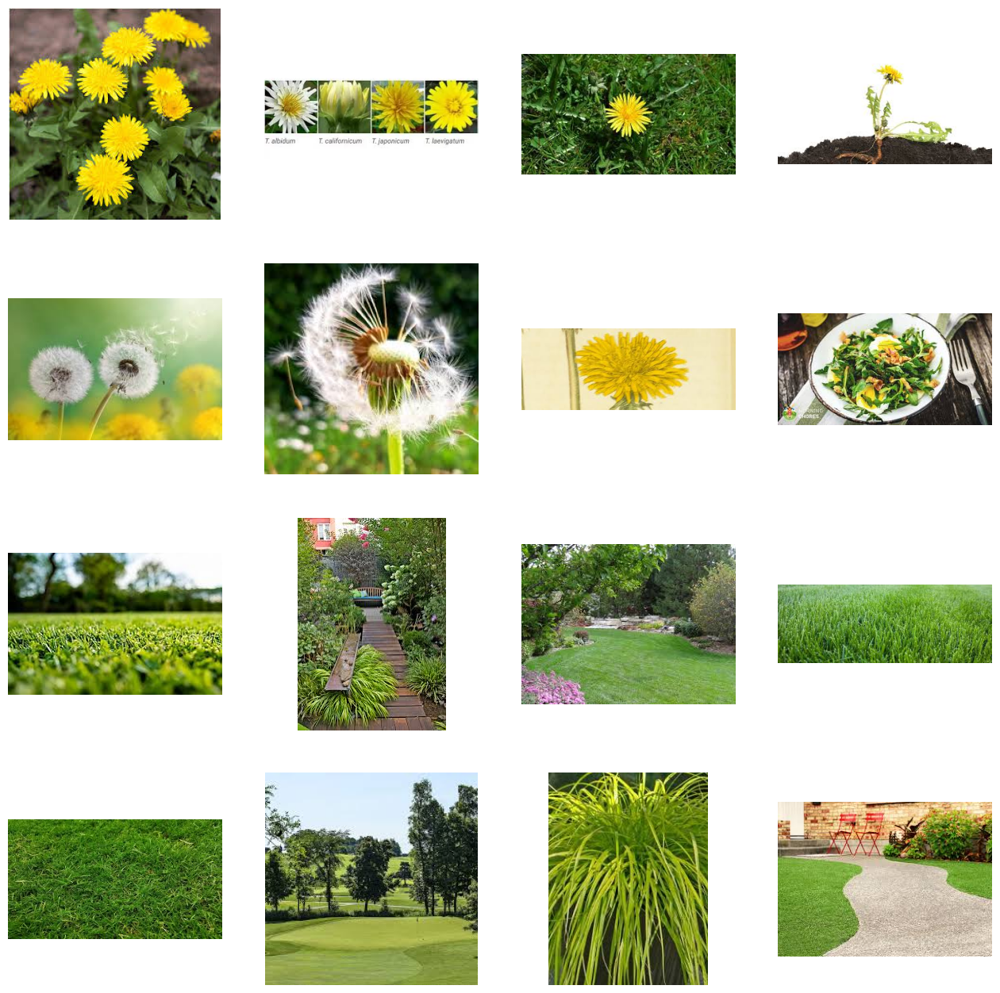

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_dandelion_pic = [os.path.join(train_dandelion_dir, fname)
                for fname in train_dandelion_names[pic_index-8:pic_index]]
next_grass_pic = [os.path.join(train_grass_dir, fname)
                for fname in train_grass_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_dandelion_pic + next_grass_pic):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 120 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/tmp/train/',  # This is the source directory for training images
        classes = ['dandelion', 'grass'],
        target_size=(200, 200),  # All images will be resized to 200x200
        batch_size=120,
        # Use binary labels
        class_mode='binary')

# Flow validation images in batches of 19 using valid_datagen generator
validation_generator = validation_datagen.flow_from_directory(
        '/tmp/valid/',  # This is the source directory for training images
        classes = ['dandelion', 'grass'],
        target_size=(200, 200),  # All images will be resized to 200x200
        batch_size=19,
        # Use binary labels
        class_mode='binary',
        shuffle=False)

Found 999 images belonging to 2 classes.
Found 157 images belonging to 2 classes.


In [ ]:
stop

## Batches

### Batch Size 32 [with textbook model]

In [ ]:
num_epochs = 100
#curr_index = wat
batch = 32 #batch_sizes[curr_index]
labels.append(f'Batch {batch}')


#build model
model = textbook_model(train_generator)
model.summary()


# set filepath for checkpointing
model_filename = f"best-for-textbook-batch{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on batch size: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_generator, validation_data=validation_generator, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 200, 200, 3)]     0         
                                                                 
 conv2d_52 (Conv2D)          (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d_40 (MaxPooli  (None, 99, 99, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_53 (Conv2D)          (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_41 (MaxPooli  (None, 48, 48, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_54 (Conv2D)          (None, 46, 46, 128)       738

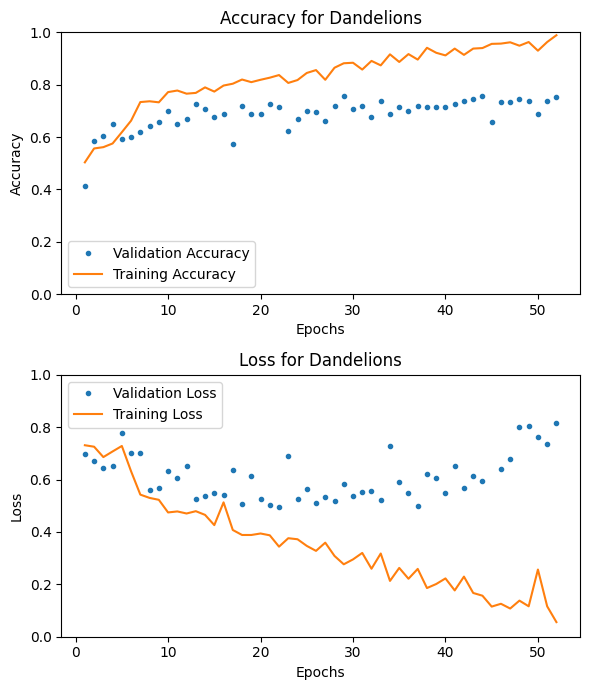

In [ ]:
plot_learning_curves(history, title="Dandelions", validate=True)

### Batch size 2

In [ ]:
num_epochs = 100
curr_index = 0
batch = batch_sizes[curr_index]
labels.insert(0, f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.insert(0, history)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 4, 4, 2)           74        
                                                                 
 flatten_7 (Flatten)         (None, 32)               

In [ ]:
labels

['Batch 2', 'Batch 12', 'Batch 32', 'Batch 64', 'Batch 128', 'Batch 180']

In [ ]:
batch_history[0].history['val_accuracy'][74]

0.640350878238678

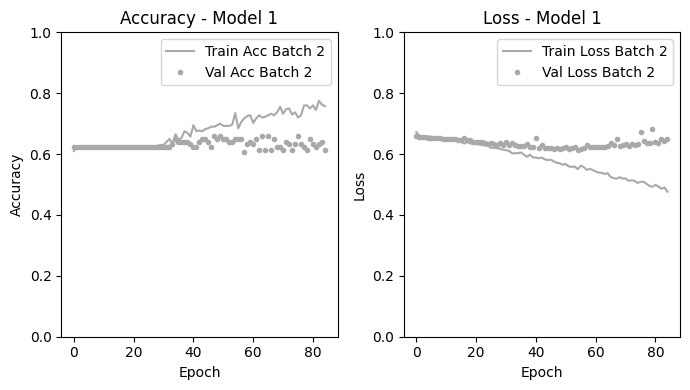

In [ ]:
plot_multiple_history([batch_history[1]], title="Batches", history_labels=labels)

### Batch Size 12

In [ ]:
num_epochs = 100
curr_index = 1
batch = batch_sizes[curr_index]
labels.append(f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 4, 4, 2)           74        
                                                                 
 flatten_2 (Flatten)         (None, 32)               

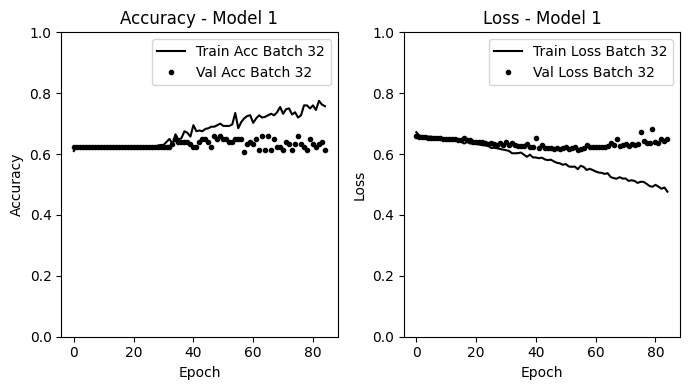

In [ ]:
plot_multiple_history(batch_history, title="Batches", history_labels=labels)

### Batch size 32 [Best]

In [ ]:
num_epochs = 100
curr_index = 2
batch = batch_sizes[curr_index]
labels.append(f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 4, 4, 2)           74        
                                                                 
 flatten_3 (Flatten)         (None, 32)               

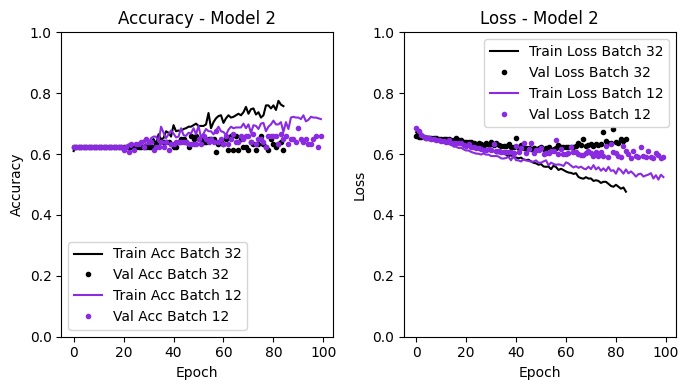

In [ ]:
plot_multiple_history(batch_history, title="Batches", history_labels=labels)

### Batch size 64

In [ ]:
num_epochs = 100
curr_index = 3
batch = batch_sizes[curr_index]
labels.append(f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 2)           74        
                                                                 
 flatten_4 (Flatten)         (None, 32)               

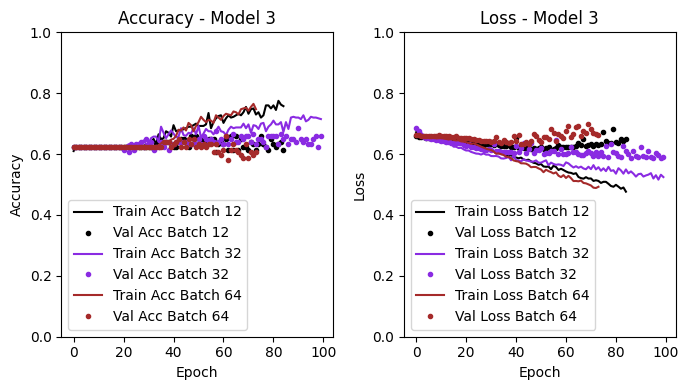

In [ ]:
plot_multiple_history(batch_history, title="Batches", history_labels=labels)

### Batch size 128

In [ ]:
num_epochs = 100
curr_index = 4
batch = batch_sizes[curr_index]
labels.append(f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 4, 4, 2)           74        
                                                                 
 flatten_5 (Flatten)         (None, 32)               

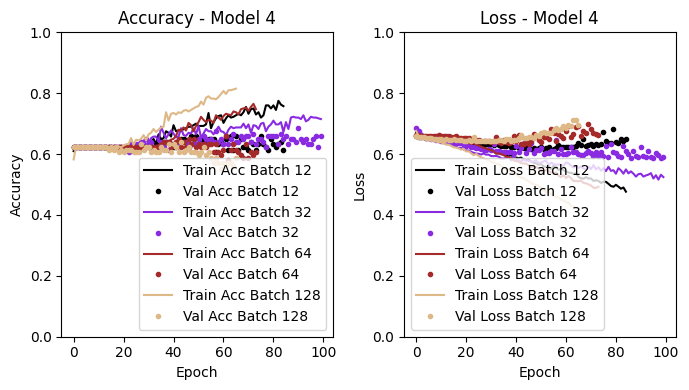

In [ ]:
plot_multiple_history(batch_history, title="Batches", history_labels=labels)

### Batch size 180

In [ ]:
num_epochs = 100
curr_index = 5
batch = batch_sizes[curr_index]
labels.append(f'Batch {batch}')

#build model
model_batch = model_choice_for_batch_resize()
model_batch.summary()


# set filepath for checkpointing
batch_models = f"best-for-batchsize-{batch}.hg5"
# batch callbacks
cb_checkpoint = callbacks.ModelCheckpoint(filepath=batch_models, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model_batch.name} on batch size: {batch}')
model_batch.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model_batch.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
batch_history.append(history)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 4)         292       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 4, 4, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 4, 4, 2)           74        
                                                                 
 flatten_6 (Flatten)         (None, 32)               

In [ ]:
labels

['Batch 12', 'Batch 32', 'Batch 64', 'Batch 128', 'Batch 180']

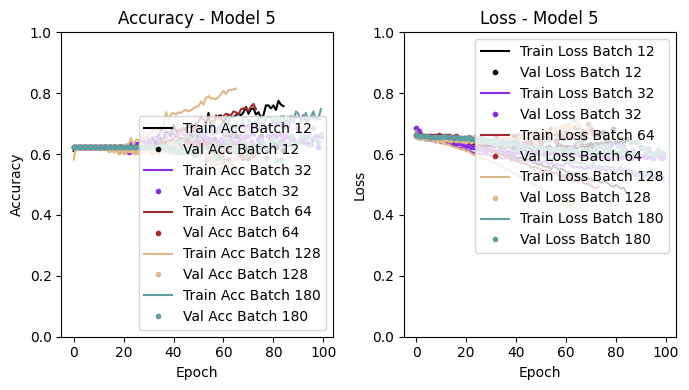

In [ ]:
plot_multiple_history(batch_history, title="Batches", history_labels=labels)

## Evaluate effect of resizing images with model from overfitting step
* Using same model and best batchsize (32) from previous experiment

* image 64x64: Epoch 100/100: 1s 106ms/step - loss: 0.5786 - accuracy: 0.7175 - val_loss: 0.6453 - val_accuracy: 0.6140
 * Epoch 36/100: 1s 84ms/step - loss: 0.5067 - accuracy: 0.7825 - val_loss: 0.6514 - val_accuracy: 0.6053
* image 128x128: Epoch 100/100 1s 94ms/step - loss: 0.5200 - accuracy: 0.7475 - val_loss: 0.6515 - val_accuracy: 0.6491
 * Epoch 40/100: 1s 81ms/step - loss: 0.5104 - accuracy: 0.7625 - val_loss: 0.6515 - val_accuracy: 0.6053
* image 200x200: Epoch 91/100 1s 79ms/step - loss: 0.4290 - accuracy: 0.8125 - val_loss: 0.6472 - val_accuracy: 0.5702
* image 256x256:

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras import callbacks

#model = load_model("/content/drive/MyDrive/Colab Notebooks/tmp-models/best-for-batchsize-32.hg5")
#model.summary()
#print("Check performance of selected model on validation: ")
#model.evaluate(val_set)

# general callback for all models
cb_stopping = callbacks.EarlyStopping(monitor="val_loss", patience=30)

history_list = []
labels = []
batch = 32
img_sizes = [64, 128, 256, 300]
curr_index = 0
num_epochs = 100

### Image size 64

Found 400 images belonging to 2 classes.
Found 114 images belonging to 2 classes.
Found 56 images belonging to 2 classes.


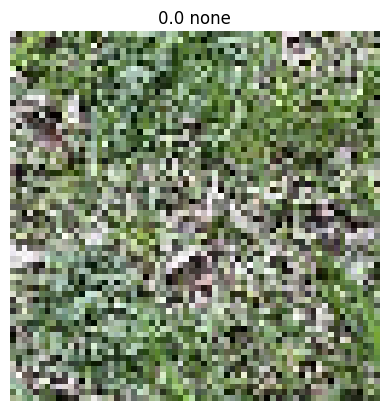

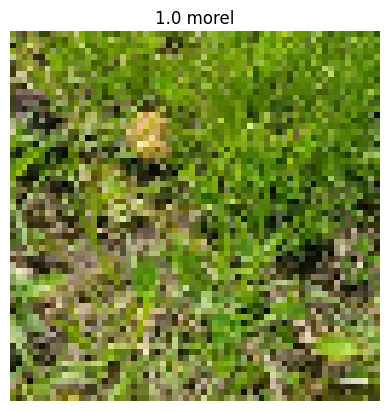

TypeError: model_overfit_choice() got an unexpected keyword argument 'input'

In [ ]:
curr_index = 0
img_size = (img_sizes[curr_index], img_sizes[curr_index])
labels.append(f'Image {img_size}')

# get images
train_set, val_set, test_set = get_images(size_of_batch=batch, image_size=img_size)
display_image(train_set)
plt.show()
display_image(val_set)
plt.show()

# load model
model = model_choice_for_img_resize(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-imgsize-{img_size}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: {img_size[0]}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
history_list.append(history)

reload this model from last session and run a few more epochs

Found 400 images belonging to 2 classes.
Found 114 images belonging to 2 classes.
Found 56 images belonging to 2 classes.


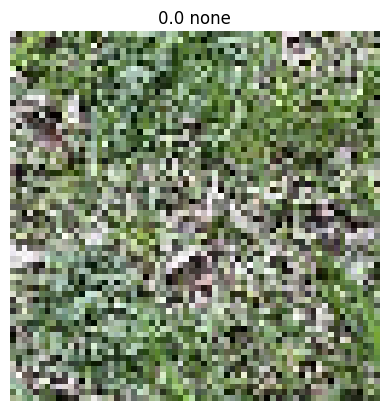

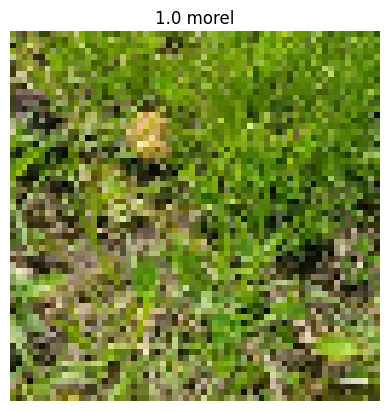

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 64, 64, 8)         224       
                                                                 
 first_layer_pool (MaxPooli  (None, 8, 8, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 8, 8, 4)           292       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 1, 1, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 1, 1, 2)           74        
                                                                 
 flatten_8 (Flatten)         (None, 2)                

In [ ]:
curr_index = 0
img_size = (img_sizes[curr_index], img_sizes[curr_index])
labels.append(f'Image {img_size}')

# get images
train_set, val_set, test_set = get_images(size_of_batch=batch, image_size=img_size)
display_image(train_set)
plt.show()
display_image(val_set)
plt.show()

model = load_model("/content/drive/MyDrive/Colab Notebooks/tmp-models/best-for-imgsize-64.hg5")
model.summary()
print("Check performance of selected model on validation: ")
model.evaluate(val_set)

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-imgsize-{img_sizes[curr_index]}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: {img_size[0]}')
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
history_list.append(history)

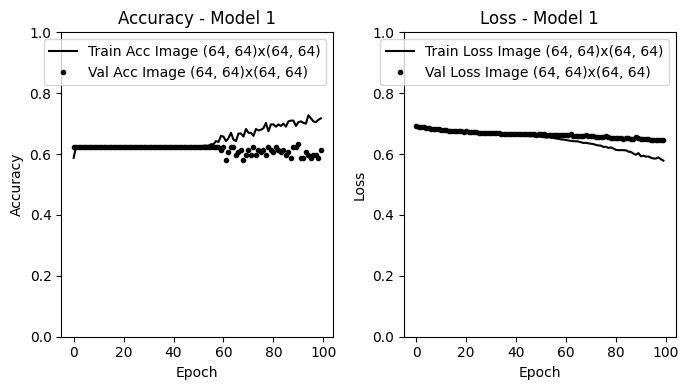

In [ ]:
plot_multiple_history(history_list, title="Images", history_labels=labels)

### Image size 128

In [ ]:
labels

'Image (128, 128)x(128, 128)'

Found 400 images belonging to 2 classes.
Found 114 images belonging to 2 classes.
Found 56 images belonging to 2 classes.


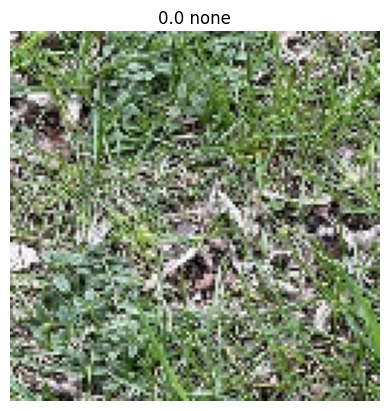

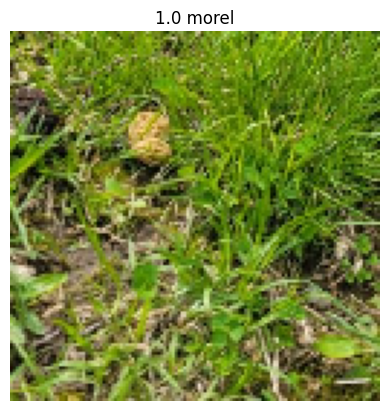

NameError: name 'model_choice_for_img_resize' is not defined

In [ ]:
curr_index = 1
img_size = (img_sizes[curr_index], img_sizes[curr_index])
labels.append(f'Image {img_size}')

# get images
train_set, val_set, test_set = get_images(size_of_batch=batch, image_size=img_size)
display_image(train_set)
plt.show()
display_image(val_set)
plt.show()

# load model
model = model_choice_for_img_resize(input=train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-imgsize-{img_size}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: {img_size[0]}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
history_list.append(history)

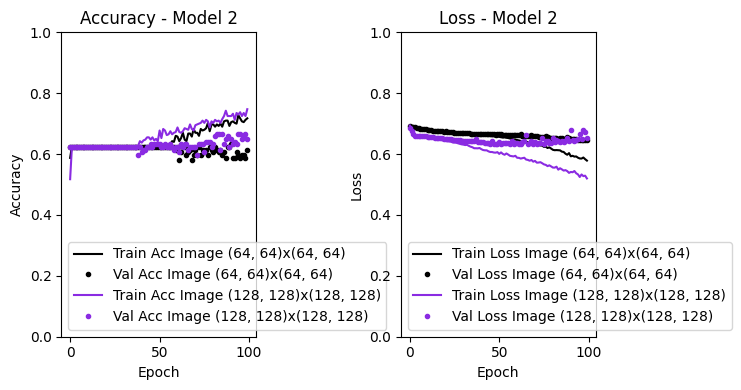

In [ ]:
plot_multiple_history(history_list, title="Images", history_labels=labels)

reload this model from last session and run a few more epochs

Found 400 images belonging to 2 classes.
Found 114 images belonging to 2 classes.
Found 56 images belonging to 2 classes.


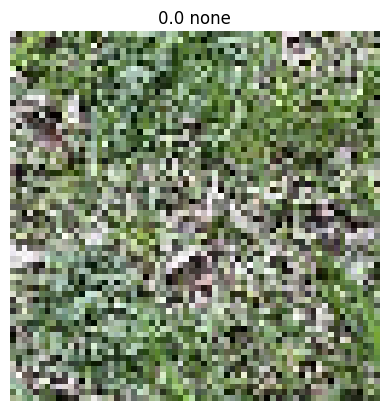

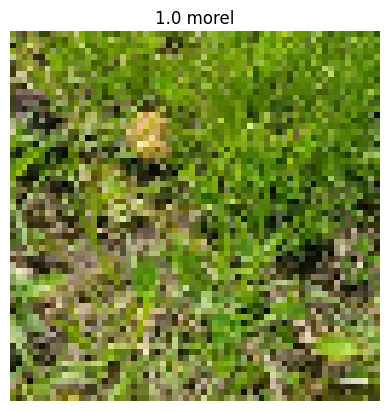

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 64, 64, 8)         224       
                                                                 
 first_layer_pool (MaxPooli  (None, 8, 8, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 8, 8, 4)           292       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 1, 1, 4)           0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 1, 1, 2)           74        
                                                                 
 flatten_8 (Flatten)         (None, 2)                

In [ ]:
curr_index = 0
img_size = (img_sizes[curr_index], img_sizes[curr_index])
labels.append(f'Image {img_size}')

# get images
train_set, val_set, test_set = get_images(size_of_batch=batch, image_size=img_size)
display_image(train_set)
plt.show()
display_image(val_set)
plt.show()

model = load_model(f"/content/drive/MyDrive/Colab Notebooks/tmp-models/best-for-imgsize-{img_sizes[curr_index]}.hg5")
model.summary()
print("Check performance of selected model on validation: ")
model.evaluate(val_set)

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-imgsize-{img_sizes[curr_index]}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: {img_size[0]}')
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
history_list.append(history)

### Image size 256

Found 400 images belonging to 2 classes.
Found 114 images belonging to 2 classes.
Found 56 images belonging to 2 classes.


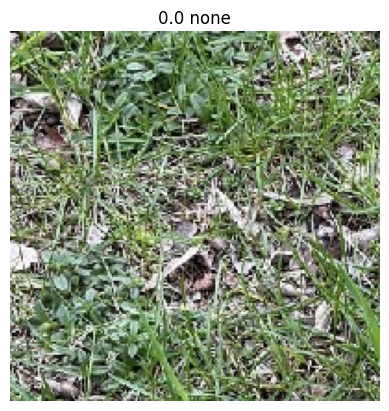

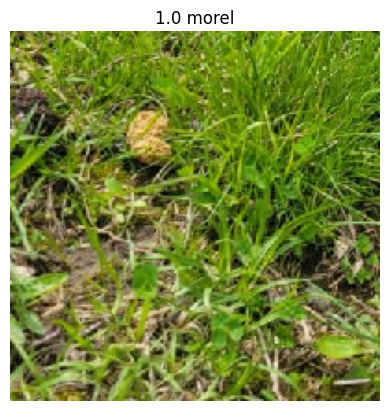

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 25, 25, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_1 (Conv2D)           (None, 25, 25, 4)         292       
                                                                 
 max_pooling2d (MaxPooling2  (None, 4, 4, 4)           0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 2)           74        
                                                                 
 flatten (Flatten)           (None, 32)                0

In [ ]:
num_epochs = 200
curr_index = 2
img_size = (img_sizes[curr_index], img_sizes[curr_index])
labels.append(f'Image {img_size}')

# get images
train_set, val_set, test_set = get_images(size_of_batch=batch, image_size=img_size)
display_image(train_set)
plt.show()
display_image(val_set)
plt.show()

# load model
model = model_choice_for_img_resize(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-imgsize-{img_size}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: {img_size[0]}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])
history_list.append(history)

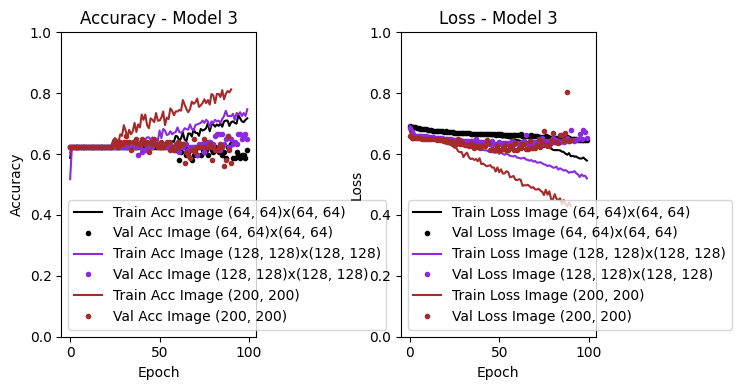

In [ ]:
plot_multiple_history(history_list, title="Images", history_labels=labels)

* Batch 2: Epoch 80/80: 10s 729ms/step - loss: 0.5728 - accuracy: 0.6825 - val_loss: 0.6064 - val_accuracy: 0.6404

## Adding a layer
* model 5 layer, varied pooling, varied filters: loss: 0.4471 - accuracy: 0.7725 - val_loss: 0.5913 - val_accuracy: 0.6579

In [ ]:
num_epochs = 100
batch = 62
model = model_smallest(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-5alayer-256.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: 256')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 first_layer_conv (Conv2D)   (None, 256, 256, 12)      336       
                                                                 
 first_layer_pool (MaxPooli  (None, 43, 43, 12)        0         
 ng2D)                                                           
                                                                 
 conv2d_261 (Conv2D)         (None, 43, 43, 6)         654       
                                                                 
 max_pooling2d_172 (MaxPool  (None, 8, 8, 6)           0         
 ing2D)                                                          
                                                                 
 conv2d_262 (Conv2D)         (None, 8, 8, 6)           330       
                                                                 
 max_pooling2d_173 (MaxPool  (None, 2, 2, 6)         

In [ ]:
from tensorflow.keras.models import load_model
model = load_model("best-for-5alayer-256.hg5")

In [ ]:
model.evaluate(val_set)

4/4 [==============================] - 0s 59ms/step - loss: 0.5833 - accuracy: 0.6491


[0.5832896828651428, 0.6491228342056274]

## Adding a layer
* model 5 layer, varied pooling, varied filters: loss: 0.4471 - accuracy: 0.7725 - val_loss: 0.5913 - val_accuracy: 0.6579

In [ ]:
num_epochs = 100
batch = 32
model = model_larger(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-8layer-256.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: 256')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_97 (Conv2D)          (None, 256, 256, 16)      448       
                                                                 
 conv2d_98 (Conv2D)          (None, 256, 256, 24)      408       
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 64, 64, 24)        0         
 ng2D)                                                           
                                                                 
 conv2d_99 (Conv2D)          (None, 64, 64, 4)         868       
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 16, 16, 4)         0         
 ng2D)                                                           
                                                                 
 conv2d_100 (Conv2D)         (None, 16, 16, 2)       

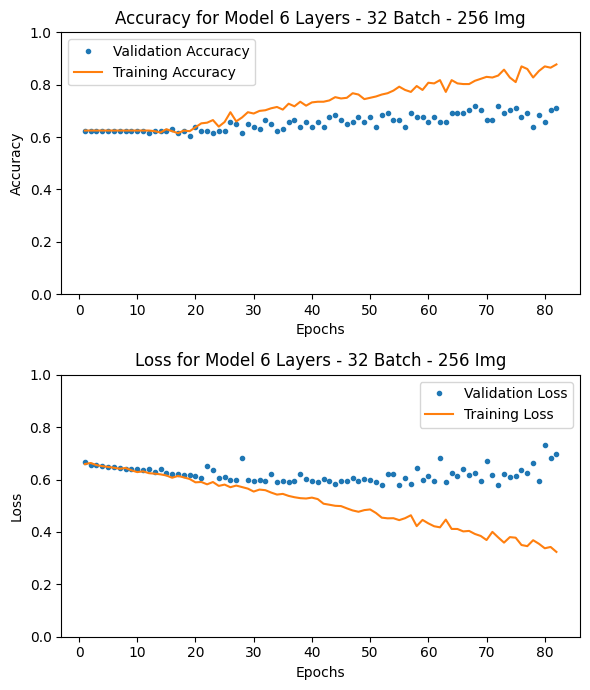

In [ ]:
plot_learning_curves(history, title="Model 6 Layers - 32 Batch - 256 Img", validate=True)

In [ ]:
batch = 93
epochs = 100
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Epoch 1/100
13/13 [==============================] - 2s 171ms/step - loss: 0.5123 - accuracy: 0.7250 - val_loss: 0.5629 - val_accuracy: 0.6491
Epoch 2/100
13/13 [==============================] - 3s 251ms/step - loss: 0.5183 - accuracy: 0.7050 - val_loss: 0.5615 - val_accuracy: 0.6491
Epoch 3/100
13/13 [==============================] - 1s 95ms/step - loss: 0.5209 - accuracy: 0.7225 - val_loss: 0.5649 - val_accuracy: 0.6667
Epoch 4/100
13/13 [==============================] - 1s 96ms/step - loss: 0.5173 - accuracy: 0.7075 - val_loss: 0.5731 - val_accuracy: 0.6579
Epoch 5/100
13/13 [==============================] - 2s 114ms/step - loss: 0.5148 - accuracy: 0.7300 - val_loss: 0.5649 - val_accuracy: 0.6579
Epoch 6/100
13/13 [==============================] - 1s 104ms/step - loss: 0.5186 - accuracy: 0.7300 - val_loss: 0.5654 - val_accuracy: 0.6754
Epoch 7/100
13/13 [==============================] - 1s 100ms/step - loss: 0.5111 - accuracy: 0.7100 - val_loss: 0.5929 - val_accuracy: 0.6579
E

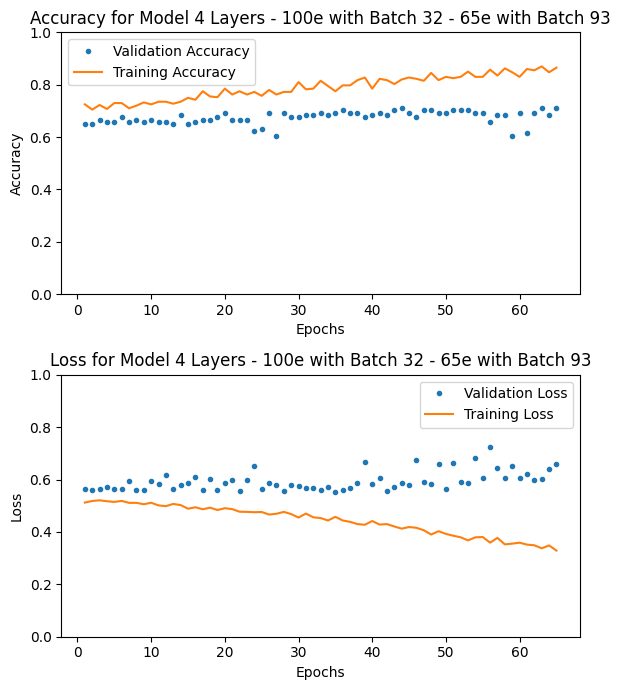

In [ ]:
plot_learning_curves(history, title="Model 4 Layers - 100e with Batch 32 - 65e with Batch 93", validate=True)

In [ ]:
batch = 128
epochs = 100
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Epoch 1/100
13/13 [==============================] - 1s 111ms/step - loss: 0.3296 - accuracy: 0.8700 - val_loss: 0.6258 - val_accuracy: 0.6930
Epoch 2/100
13/13 [==============================] - 1s 99ms/step - loss: 0.3299 - accuracy: 0.8475 - val_loss: 0.6403 - val_accuracy: 0.6930
Epoch 3/100
13/13 [==============================] - 3s 231ms/step - loss: 0.3357 - accuracy: 0.8475 - val_loss: 0.5991 - val_accuracy: 0.6842
Epoch 4/100
13/13 [==============================] - 1s 105ms/step - loss: 0.3075 - accuracy: 0.8775 - val_loss: 0.7209 - val_accuracy: 0.7018
Epoch 5/100
13/13 [==============================] - 1s 103ms/step - loss: 0.3263 - accuracy: 0.8600 - val_loss: 0.6195 - val_accuracy: 0.6754
Epoch 6/100
13/13 [==============================] - 1s 99ms/step - loss: 0.2932 - accuracy: 0.8950 - val_loss: 0.6353 - val_accuracy: 0.6930
Epoch 7/100
13/13 [==============================] - 1s 108ms/step - loss: 0.2946 - accuracy: 0.8900 - val_loss: 0.6285 - val_accuracy: 0.6930
E

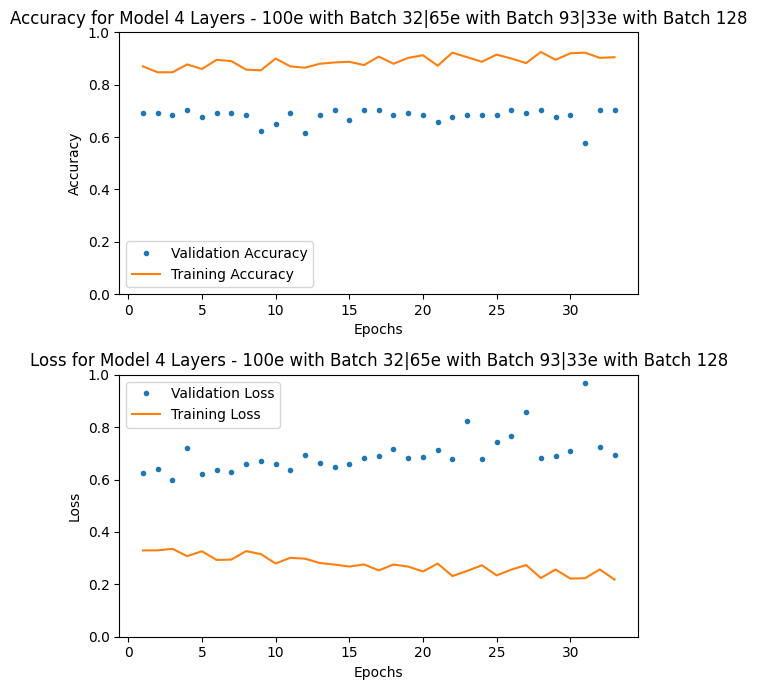

In [ ]:
plot_learning_curves(history, title="Model 4 Layers - 100e with Batch 32|65e with Batch 93|33e with Batch 128", validate=True)

In [ ]:
num_epochs = 100
batch = 64
model = model_larger(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-for-larger-batch{batch}-256.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} on image size: 256 with batch: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 256, 256, 8)       224       
                                                                 
 first_layer_pool (MaxPooli  (None, 43, 43, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 43, 43, 8)         584       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 8, 8, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 8)           584       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 2, 2, 8)          

KeyboardInterrupt: 

In [ ]:
# compile and fit
print(f'Training model {model.name} on image size: 256 with batch: {batch}')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Training model sequential_3 on image size: 256 with batch: 64
Epoch 1/100
13/13 [==============================] - 3s 125ms/step - loss: 0.5384 - accuracy: 0.7075 - val_loss: 0.6228 - val_accuracy: 0.6316
Epoch 2/100
13/13 [==============================] - 2s 150ms/step - loss: 0.5293 - accuracy: 0.6975 - val_loss: 0.5874 - val_accuracy: 0.6754
Epoch 3/100
13/13 [==============================] - 2s 168ms/step - loss: 0.5245 - accuracy: 0.7100 - val_loss: 0.5624 - val_accuracy: 0.7193
Epoch 4/100
13/13 [==============================] - 1s 104ms/step - loss: 0.5332 - accuracy: 0.7100 - val_loss: 0.5792 - val_accuracy: 0.6579
Epoch 5/100
13/13 [==============================] - 2s 160ms/step - loss: 0.5397 - accuracy: 0.7075 - val_loss: 0.5604 - val_accuracy: 0.7193
Epoch 6/100
13/13 [==============================] - 1s 95ms/step - loss: 0.5182 - accuracy: 0.7050 - val_loss: 0.5887 - val_accuracy: 0.6579
Epoch 7/100
13/13 [==============================] - 1s 101ms/step - loss: 0.5281

KeyboardInterrupt: 